<a href="https://colab.research.google.com/github/Tasin5541/Detection-of-Cricketing-Activities-using-Deep-Learning/blob/master/Detection_of_Cricketing_Activities_using_Deep_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Fastai

In [ ]:
from fastai.vision import *
import fastai

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
root_dir = "/content/gdrive/My Drive/"

Mounted at /content/gdrive


##In case drive is not loaded properly

In [ ]:
drive.flush_and_unmount()

Drive not mounted, so nothing to flush and unmount.


##DEFINE CLASSES

In [ ]:
classes = ['Sweep Shot', 'Drive Shot', 'Square Cut', 'Pull Shot', 'Umpire Out', 'Umpire Six', 'wide', 'lbw', 'Century']

In [ ]:
path = Path(root_dir + 'University/Thesis/data_rgb/shots')

##LOADING IMAGES & NORMALIZATION

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
np.random.seed(42)
data = ImageDataBunch.from_folder(path, train="Train", test="Test", valid_pct=0.2,
 ds_tfms=get_transforms(max_rotate=None), size=(224,224), num_workers=4).normalize(imagenet_stats)

In [ ]:
print(data)

ImageDataBunch;

Train: LabelList (2559 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
Century,Century,Century,Century,Century
Path: /content/gdrive/My Drive/University/Thesis/data_rgb/shots;

Valid: LabelList (639 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
Drive Shot,Century,Century,Pull Shot,Umpire Six
Path: /content/gdrive/My Drive/University/Thesis/data_rgb/shots;

Test: LabelList (35 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: EmptyLabelList
,,,,
Path: /content/gdrive/My Drive/University/Thesis/data_rgb/shots


In [ ]:
print(data.test_ds.items.shape[0])

16


['Century', 'Drive Shot', 'Pull Shot', 'Square Cut', 'Sweep Shot', 'Umpire Out', 'Umpire Six', 'lbw', 'wide']


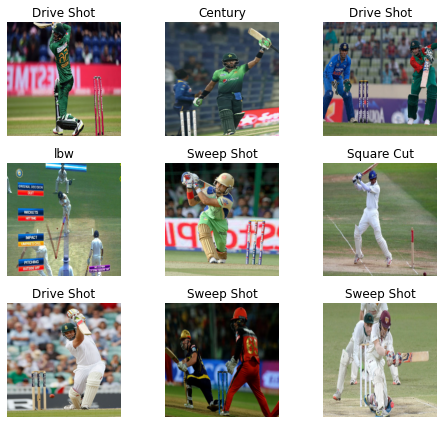

In [ ]:
print(data.classes)
data.show_batch(rows=3, figsize=(7,6))

##CNN

####resNet50

In [ ]:
learn = cnn_learner(data, models.resnet50, metrics=accuracy)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


####resNet101

In [ ]:
learn = cnn_learner(data, models.resnet101, metrics=accuracy)

Downloading: "https://download.pytorch.org/models/resnet101-5d3b4d8f.pth" to /root/.cache/torch/hub/checkpoints/resnet101-5d3b4d8f.pth


####resNet34

In [ ]:
learn = cnn_learner(data, models.resnet34, metrics=accuracy)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth


####vgg16_bn

In [ ]:
learn = cnn_learner(data, models.vgg16_bn, metrics=accuracy)

Downloading: "https://download.pytorch.org/models/vgg16_bn-6c64b313.pth" to /root/.cache/torch/hub/checkpoints/vgg16_bn-6c64b313.pth


####alexnet

In [ ]:
learn = cnn_learner(data, models.alexnet, metrics=accuracy)

Downloading: "https://download.pytorch.org/models/alexnet-owt-4df8aa71.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-4df8aa71.pth


##Model

In [ ]:
learn.model

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0): Conv2d(64, 256

##Training (with one_cycle)

####resnet50

In [ ]:
learn.fit_one_cycle(5)

epoch,train_loss,valid_loss,accuracy,time
0,1.653535,0.761589,0.760563,01:11
1,1.040191,0.538558,0.841941,01:09
2,0.691955,0.376634,0.857590,01:09
3,0.467856,0.294010,0.901408,01:09
4,0.347496,0.275379,0.918623,01:09


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


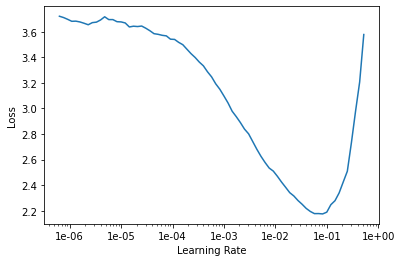

In [ ]:
learn.lr_find()
learn.recorder.plot()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


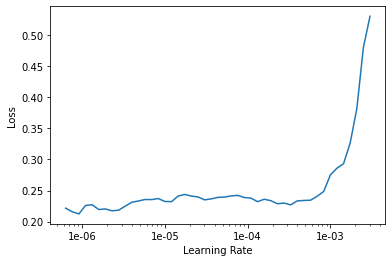

In [ ]:
learn.save('stage-1')
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

In [ ]:
learn.load('stage-1');

In [ ]:
learn.fit_one_cycle(5, max_lr=slice(3e-5,3e-4))

epoch,train_loss,valid_loss,accuracy,time
0,0.217387,0.208931,0.945227,01:11
1,0.191253,0.188901,0.948357,01:10
2,0.142590,0.139271,0.970266,01:10
3,0.092569,0.100541,0.968701,01:10
4,0.067682,0.102827,0.970266,01:10


In [ ]:
learn.save('stage-2')

In [ ]:
learn.fit_one_cycle(1, max_lr=slice(2e-5,2e-4))

epoch,train_loss,valid_loss,accuracy,time
0,0.034476,0.096664,0.971831,01:11


In [ ]:
learn.save('stage-2')

In [ ]:
learn.fit_one_cycle(1, max_lr=slice(1e-5,1e-4))

epoch,train_loss,valid_loss,accuracy,time
0,0.067865,0.023421,0.993740,01:17


In [ ]:
learn.save('stage-2')

In [ ]:
learn.load('stage-2');

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)

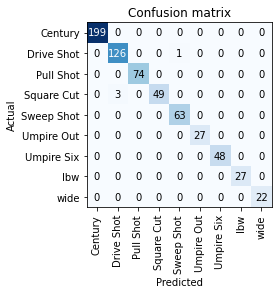

In [ ]:
interp.plot_confusion_matrix()

In [ ]:
interp.most_confused()

[('Square Cut', 'Drive Shot', 3), ('Drive Shot', 'Sweep Shot', 1)]

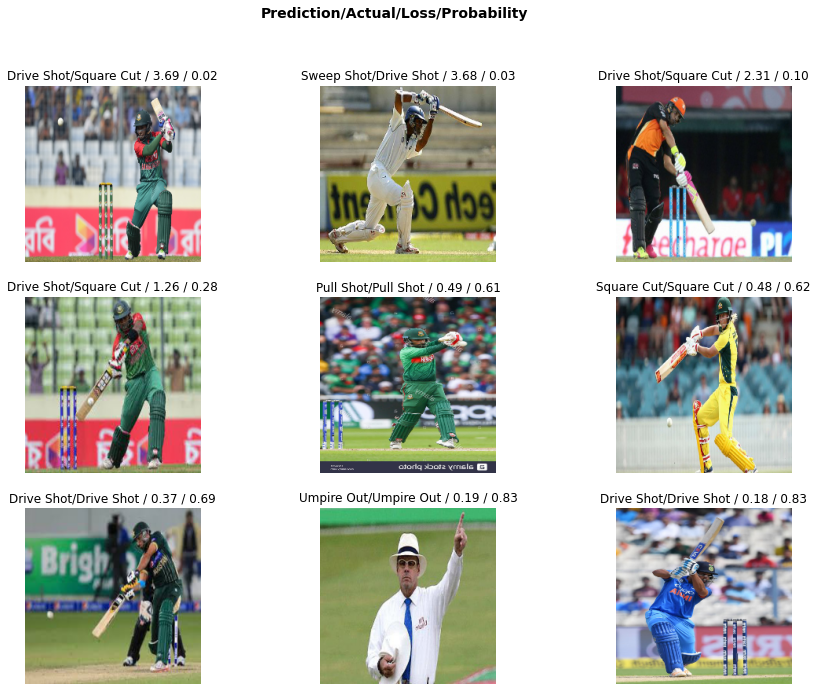

In [ ]:
interp.plot_top_losses(9, figsize=(15,11))

In [ ]:
predictions, targs = learn.get_preds(DatasetType.Test)
labels = np.argmax(predictions, 1)

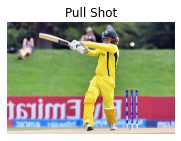

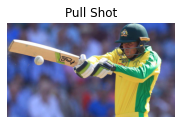

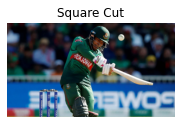

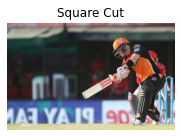

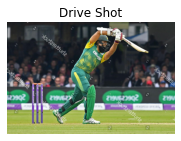

...

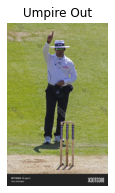

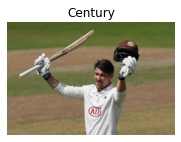

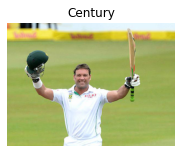

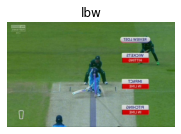

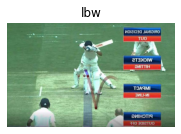

In [ ]:
test_predictions_direct = [data.classes[int(x)] for x in labels]

for i in range(len(test_predictions_direct)):
  img = open_image(data.test_ds.items[i])
  img.show(title=test_predictions_direct[i])

####resnet101

In [ ]:
learn.fit_one_cycle(5)

epoch,train_loss,valid_loss,accuracy,time
0,1.620811,0.783872,0.780908,01:17
1,0.979181,0.547316,0.829421,01:16
2,0.632584,0.319899,0.909233,01:14
3,0.412031,0.292236,0.904538,01:14
4,0.295168,0.286485,0.902973,01:14


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


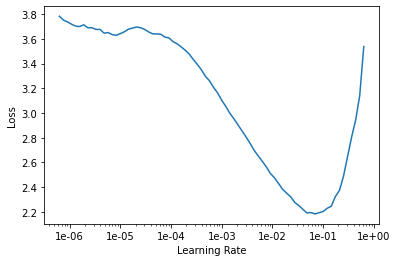

In [ ]:
learn.lr_find()
learn.recorder.plot()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


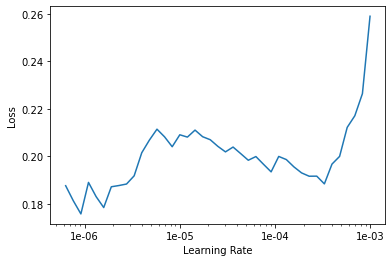

In [ ]:
learn.save('stage-1')
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

In [ ]:
learn.load('stage-1');

In [ ]:
learn.fit_one_cycle(5, max_lr=slice(3e-7,3e-6))

epoch,train_loss,valid_loss,accuracy,time
0,0.208816,0.283095,0.910798,01:19
1,0.196853,0.277642,0.913928,01:18
2,0.196259,0.275833,0.912363,01:17
3,0.178935,0.269669,0.913928,01:18
4,0.176302,0.272116,0.912363,01:17


In [ ]:
learn.save('stage-2')

In [ ]:
learn.load('stage-2');

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)

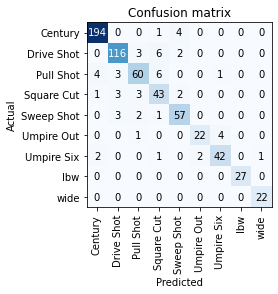

In [ ]:
interp.plot_confusion_matrix()

In [ ]:
interp.most_confused()

[('Drive Shot', 'Square Cut', 6),
 ('Pull Shot', 'Square Cut', 6),
 ('Century', 'Sweep Shot', 4),
 ('Pull Shot', 'Century', 4),
 ('Umpire Out', 'Umpire Six', 4),
 ('Drive Shot', 'Pull Shot', 3),
 ('Pull Shot', 'Drive Shot', 3),
 ('Square Cut', 'Drive Shot', 3),
 ('Square Cut', 'Pull Shot', 3),
 ('Sweep Shot', 'Drive Shot', 3),
 ('Drive Shot', 'Sweep Shot', 2),
 ('Square Cut', 'Sweep Shot', 2),
 ('Sweep Shot', 'Pull Shot', 2),
 ('Umpire Six', 'Century', 2),
 ('Umpire Six', 'Umpire Out', 2),
 ('Century', 'Square Cut', 1),
 ('Pull Shot', 'Umpire Six', 1),
 ('Square Cut', 'Century', 1),
 ('Sweep Shot', 'Square Cut', 1),
 ('Umpire Out', 'Pull Shot', 1),
 ('Umpire Six', 'Square Cut', 1),
 ('Umpire Six', 'wide', 1)]

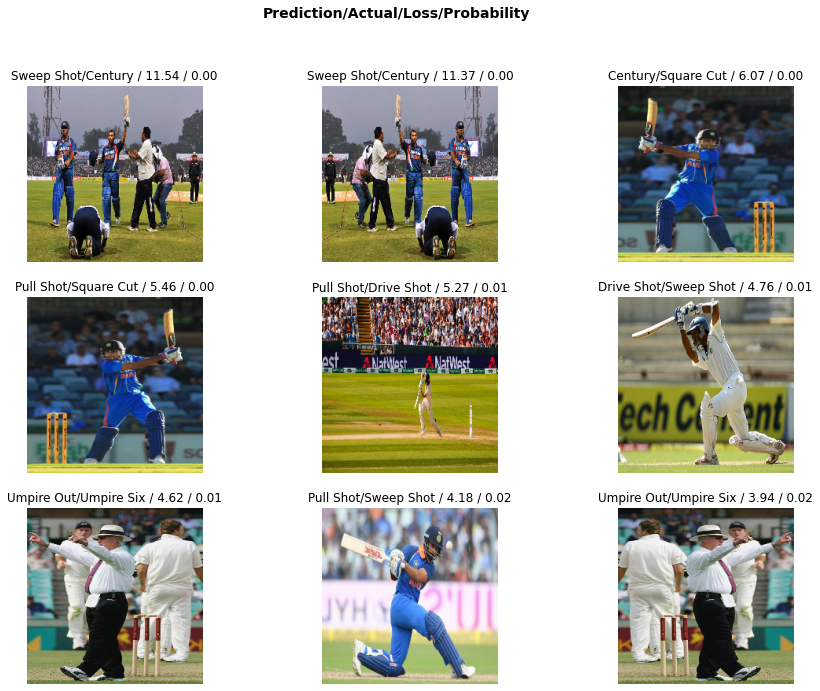

In [ ]:
interp.plot_top_losses(9, figsize=(15,11))

####resnet34

In [ ]:
learn.fit_one_cycle(5)

epoch,train_loss,valid_loss,accuracy,time
0,2.219072,0.878114,0.729264,01:08
1,1.309187,0.517654,0.804382,01:07
2,0.890819,0.405427,0.865415,01:07
3,0.657682,0.338595,0.893584,01:07
4,0.514401,0.327600,0.899844,01:06


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


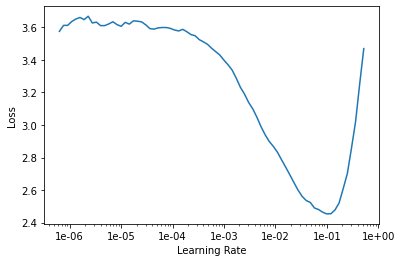

In [ ]:
learn.lr_find()
learn.recorder.plot()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


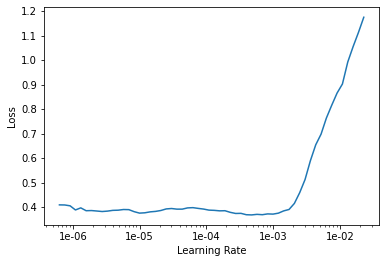

In [ ]:
learn.save('stage-1')
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

In [ ]:
learn.load('stage-1');

In [ ]:
learn.fit_one_cycle(5, max_lr=slice(3e-5,3e-4))

epoch,train_loss,valid_loss,accuracy,time
0,0.380073,0.224450,0.923318,01:08
1,0.281957,0.147332,0.948357,01:07
2,0.185332,0.144385,0.954617,01:07
3,0.128579,0.122918,0.968701,01:06
4,0.088884,0.106548,0.970266,01:07


In [ ]:
learn.save('stage-2')

In [ ]:
learn.fit_one_cycle(1, max_lr=slice(2e-5,2e-4))

epoch,train_loss,valid_loss,accuracy,time
0,0.051271,0.109870,0.968701,01:07


In [ ]:
learn.load('stage-2');

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)

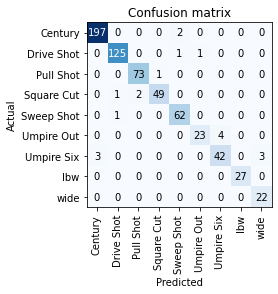

In [ ]:
interp.plot_confusion_matrix()

In [ ]:
interp.most_confused()

[('Umpire Out', 'Umpire Six', 4),
 ('Umpire Six', 'Century', 3),
 ('Umpire Six', 'wide', 3),
 ('Century', 'Sweep Shot', 2),
 ('Square Cut', 'Pull Shot', 2),
 ('Drive Shot', 'Sweep Shot', 1),
 ('Drive Shot', 'Umpire Out', 1),
 ('Pull Shot', 'Square Cut', 1),
 ('Square Cut', 'Drive Shot', 1),
 ('Sweep Shot', 'Drive Shot', 1)]

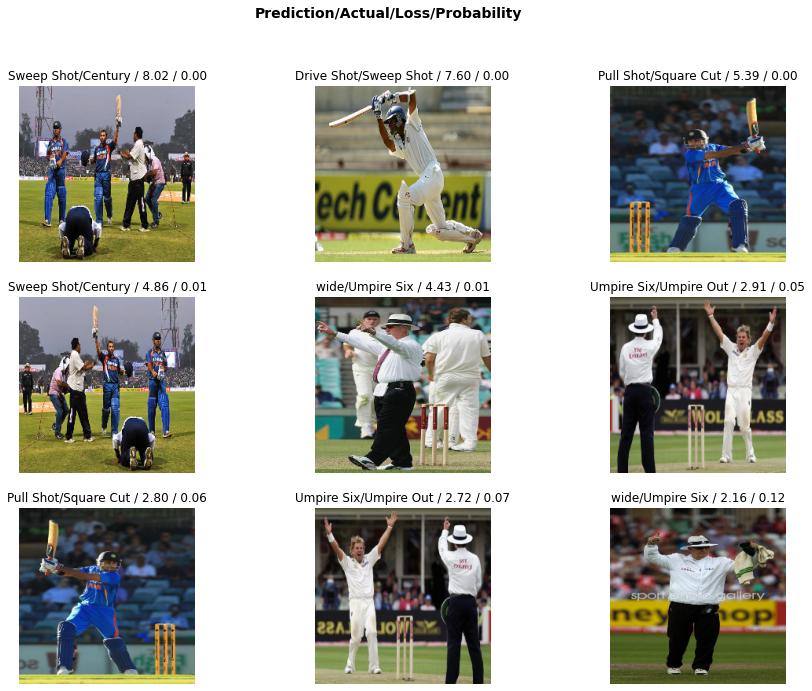

In [ ]:
interp.plot_top_losses(9, figsize=(15,11))

####vgg

In [ ]:
learn.fit_one_cycle(5)

epoch,train_loss,valid_loss,accuracy,time
0,2.317073,0.883641,0.702660,01:21
1,1.389561,0.562563,0.807512,01:16
2,0.940916,0.446977,0.859155,01:15
3,0.687566,0.410767,0.866980,01:15
4,0.537295,0.395521,0.881064,01:15


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


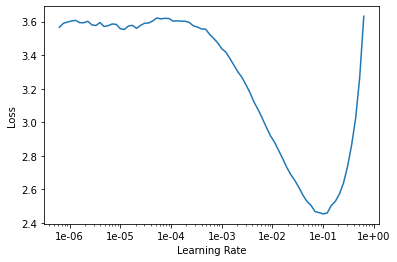

In [ ]:
learn.lr_find()
learn.recorder.plot()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


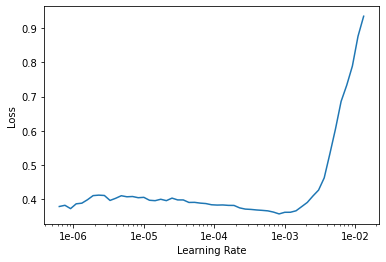

In [ ]:
learn.save('stage-1')
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

In [ ]:
learn.load('stage-1');

In [ ]:
learn.fit_one_cycle(5, max_lr=slice(3e-5,3e-4))

epoch,train_loss,valid_loss,accuracy,time
0,0.382104,0.325929,0.907668,01:17
1,0.277848,0.213988,0.931142,01:17
2,0.190675,0.165563,0.948357,01:16
3,0.137900,0.146780,0.951487,01:17
4,0.104118,0.141469,0.956182,01:16


In [ ]:
learn.save('stage-2')

In [ ]:
learn.fit_one_cycle(3, max_lr=slice(2e-5,2e-4))

epoch,train_loss,valid_loss,accuracy,time
0,0.071292,0.132343,0.964006,01:14
1,0.061153,0.133401,0.960876,01:14
2,0.051227,0.139091,0.960876,01:15


In [ ]:
learn.load('stage-2');

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)

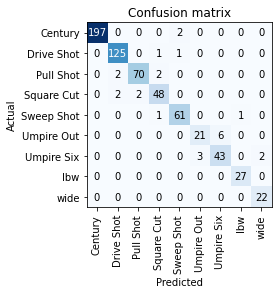

In [ ]:
interp.plot_confusion_matrix()

In [ ]:
interp.most_confused()

[('Umpire Out', 'Umpire Six', 6),
 ('Umpire Six', 'Umpire Out', 3),
 ('Century', 'Sweep Shot', 2),
 ('Pull Shot', 'Drive Shot', 2),
 ('Pull Shot', 'Square Cut', 2),
 ('Square Cut', 'Drive Shot', 2),
 ('Square Cut', 'Pull Shot', 2),
 ('Umpire Six', 'wide', 2),
 ('Drive Shot', 'Square Cut', 1),
 ('Drive Shot', 'Sweep Shot', 1),
 ('Sweep Shot', 'Square Cut', 1),
 ('Sweep Shot', 'lbw', 1)]

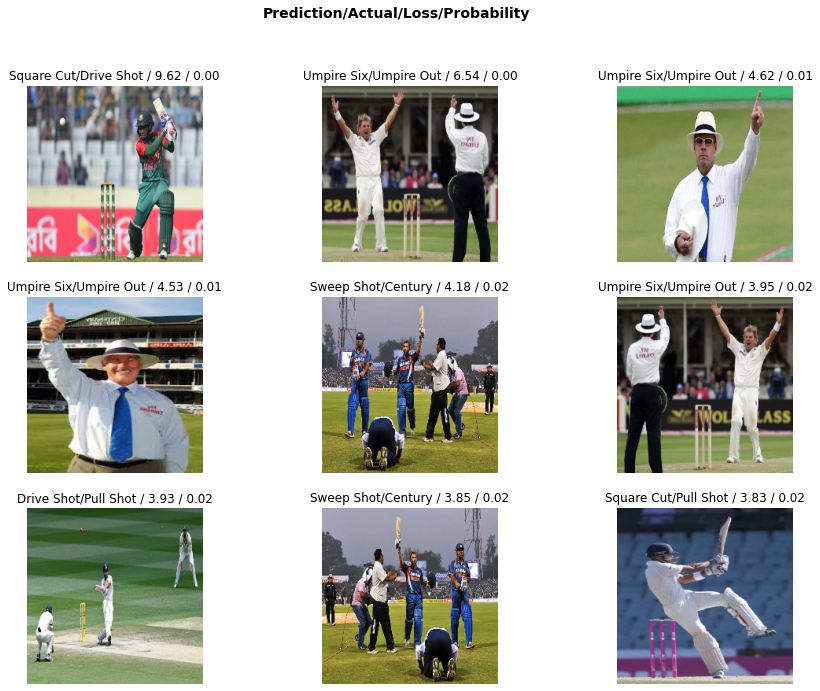

In [ ]:
interp.plot_top_losses(9, figsize=(15,11))

####alexnet

In [ ]:
learn.fit_one_cycle(5)

epoch,train_loss,valid_loss,accuracy,time
0,2.576580,1.137277,0.624413,03:19
1,1.698444,0.773723,0.735524,01:08
2,1.249945,0.619791,0.794992,01:06
3,1.026545,0.585730,0.807512,01:05
4,0.866088,0.580081,0.812207,01:05


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


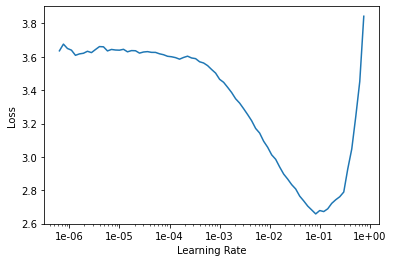

In [ ]:
learn.lr_find()
learn.recorder.plot()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


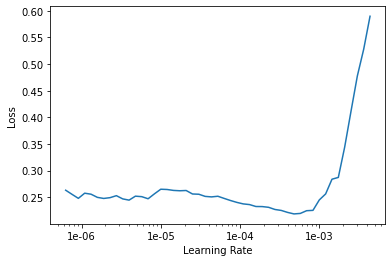

In [ ]:
learn.save('stage-1')
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

In [ ]:
learn.load('stage-1');

In [ ]:
learn.fit_one_cycle(5, max_lr=slice(3e-5,3e-4))

epoch,train_loss,valid_loss,accuracy,time
0,0.739667,0.572924,0.815336,01:08
1,0.741915,0.553821,0.801252,01:06
2,0.738516,0.547648,0.823161,01:06
3,0.709311,0.537337,0.818466,01:06
4,0.714153,0.536722,0.818466,01:05


In [ ]:
learn.save('stage-2')

In [ ]:
learn.load('stage-2');

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)

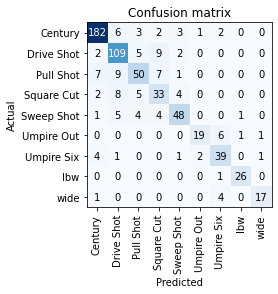

In [ ]:
interp.plot_confusion_matrix()

In [ ]:
interp.most_confused()

[('Drive Shot', 'Square Cut', 9),
 ('Pull Shot', 'Drive Shot', 9),
 ('Square Cut', 'Drive Shot', 8),
 ('Pull Shot', 'Century', 7),
 ('Pull Shot', 'Square Cut', 7),
 ('Century', 'Drive Shot', 6),
 ('Umpire Out', 'Umpire Six', 6),
 ('Drive Shot', 'Pull Shot', 5),
 ('Square Cut', 'Pull Shot', 5),
 ('Sweep Shot', 'Drive Shot', 5),
 ('Square Cut', 'Sweep Shot', 4),
 ('Sweep Shot', 'Pull Shot', 4),
 ('Sweep Shot', 'Square Cut', 4),
 ('Umpire Six', 'Century', 4),
 ('wide', 'Umpire Six', 4),
 ('Century', 'Pull Shot', 3),
 ('Century', 'Sweep Shot', 3),
 ('Century', 'Square Cut', 2),
 ('Century', 'Umpire Six', 2),
 ('Drive Shot', 'Century', 2),
 ('Drive Shot', 'Sweep Shot', 2),
 ('Square Cut', 'Century', 2),
 ('Umpire Six', 'Umpire Out', 2),
 ('Century', 'Umpire Out', 1),
 ('Pull Shot', 'Sweep Shot', 1),
 ('Sweep Shot', 'Century', 1),
 ('Sweep Shot', 'lbw', 1),
 ('Umpire Out', 'lbw', 1),
 ('Umpire Out', 'wide', 1),
 ('Umpire Six', 'Drive Shot', 1),
 ('Umpire Six', 'Sweep Shot', 1),
 ('Umpire Six

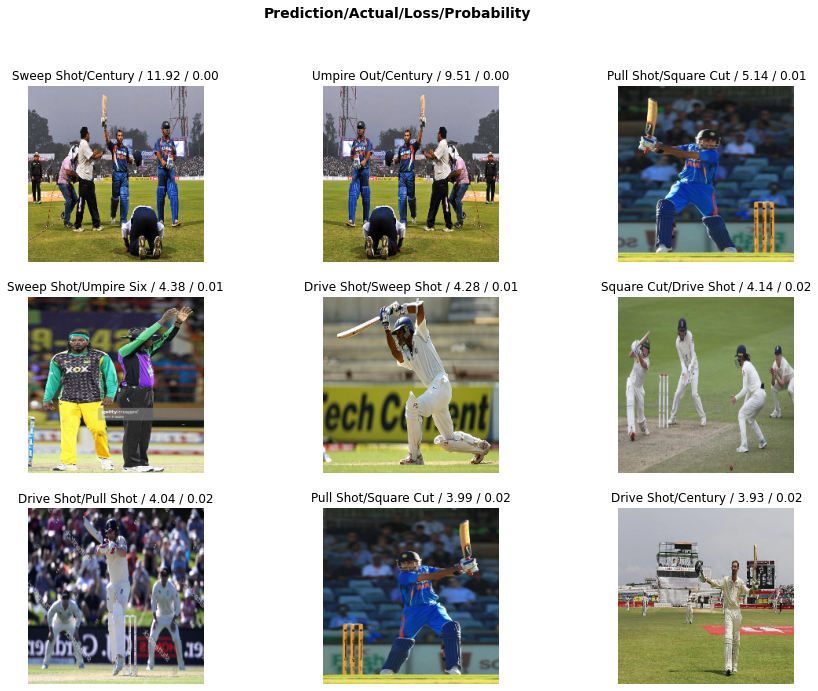

In [ ]:
interp.plot_top_losses(9, figsize=(15,11))

##Training (without one_cycle)

####resnet50

In [ ]:
learn.fit(50)

epoch,train_loss,valid_loss,accuracy,time
0,1.264594,0.679704,0.794992,08:59
1,0.782898,0.420307,0.857590,01:19
2,0.525267,0.313480,0.895149,01:16
3,0.374476,0.264904,0.913928,01:17
4,0.296859,0.273288,0.915493,01:16
5,0.251797,0.219923,0.937402,01:17
6,0.228934,0.205857,0.937402,01:17
7,0.181008,0.214811,0.935837,01:17
8,0.161077,0.195807,0.948357,01:16
9,0.151831,0.204811,0.943662,01:17


In [ ]:
learn.save('stage-50')

In [ ]:
learn.load('stage-50');

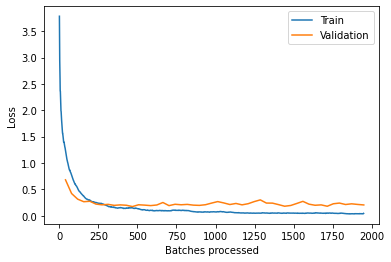

In [ ]:
learn.recorder.plot_losses()

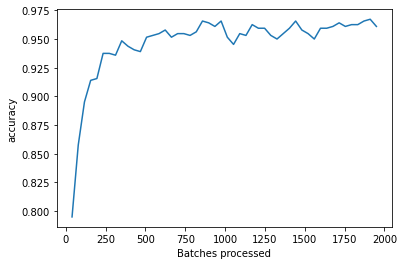

In [ ]:
learn.recorder.plot_metrics()

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)

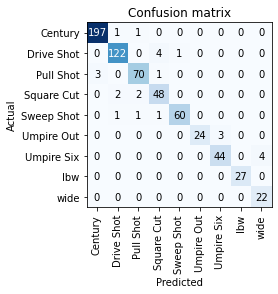

In [ ]:
interp.plot_confusion_matrix()

In [ ]:
interp.most_confused()

[('Drive Shot', 'Square Cut', 4),
 ('Umpire Six', 'wide', 4),
 ('Pull Shot', 'Century', 3),
 ('Umpire Out', 'Umpire Six', 3),
 ('Square Cut', 'Drive Shot', 2),
 ('Square Cut', 'Pull Shot', 2),
 ('Century', 'Drive Shot', 1),
 ('Century', 'Pull Shot', 1),
 ('Drive Shot', 'Sweep Shot', 1),
 ('Pull Shot', 'Square Cut', 1),
 ('Sweep Shot', 'Drive Shot', 1),
 ('Sweep Shot', 'Pull Shot', 1),
 ('Sweep Shot', 'Square Cut', 1)]

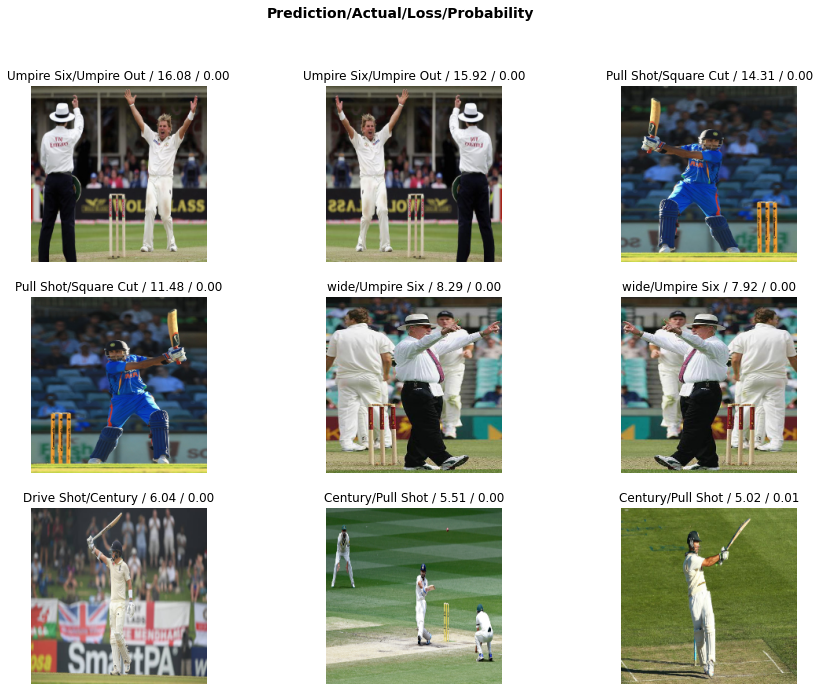

In [ ]:
interp.plot_top_losses(9, figsize=(15,11))

In [ ]:
predictions, targs = learn.get_preds(DatasetType.Test)
labels = np.argmax(predictions, 1)

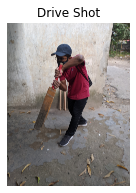

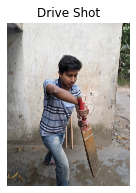

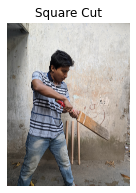

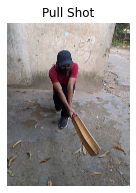

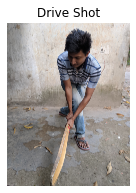

...

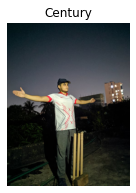

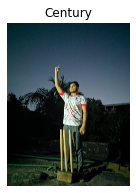

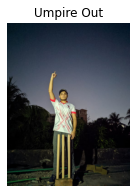

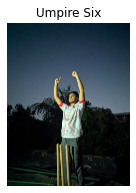

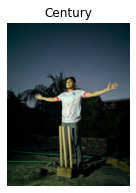

In [ ]:
test_predictions_direct = [data.classes[int(x)] for x in labels]

for i in range(len(test_predictions_direct)):
  img = open_image(data.test_ds.items[i])
  img.show(title=test_predictions_direct[i])

##MODEL PATH

In [ ]:
model_path = Path(root_dir + 'University/Thesis/data_rgb/Models')

##SAVE MODEL

In [ ]:
learn.export()

##PREDICTION

####resnet50

In [ ]:
defaults.device = torch.device('cuda')

In [ ]:
learn = load_learner(model_path, 'resNet50.pkl')

In [ ]:
y = data.valid_ds.y.items
preds,y_hat,losses = learn.get_preds(with_loss=True)

from sklearn.metrics import classification_report
y_hat = np.argmax(preds,axis=1)
print(classification_report(y, y_hat, target_names=data.valid_ds.y.classes))

              precision    recall  f1-score   support

     Century       1.00      1.00      1.00       199
  Drive Shot       0.98      0.99      0.98       127
   Pull Shot       0.99      0.99      0.99        74
  Square Cut       0.98      0.92      0.95        52
  Sweep Shot       0.98      1.00      0.99        63
  Umpire Out       1.00      1.00      1.00        27
  Umpire Six       1.00      1.00      1.00        48
         lbw       1.00      1.00      1.00        27
        wide       1.00      1.00      1.00        22

    accuracy                           0.99       639
   macro avg       0.99      0.99      0.99       639
weighted avg       0.99      0.99      0.99       639



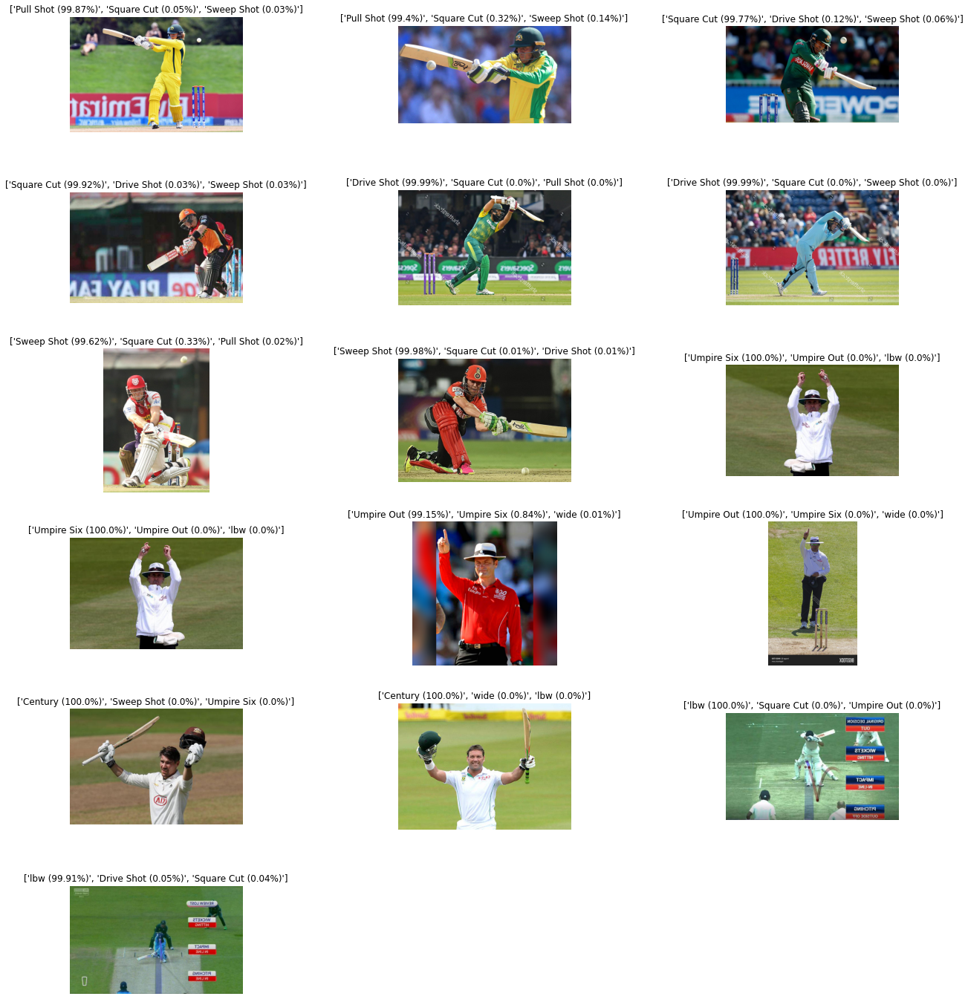

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import math 

plt.figure(figsize=[20,25])
plt.subplots_adjust(wspace = 0.9)
k=0

for i in data.test_ds.items:
  img = open_image(i)

  # Get best first prediction
  pred_1_class, indice, preds = learn.predict(img)

  # Get all best predictions
  preds_sorted, idxs = preds.sort(descending=True)

  # Get best 3 predictions - classes
  pred_2_class = learn.data.classes[idxs[1]]
  pred_3_class = learn.data.classes[idxs[2]]
    
  # Get best 3 predictions - probabilities
  pred_1_prob = np.round(100*preds_sorted[0].item(),2)
  pred_2_prob = np.round(100*preds_sorted[1].item(),2)
  pred_3_prob = np.round(100*preds_sorted[2].item(),2)
  preds_best3 = [f'{pred_1_class} ({pred_1_prob}%)', f'{pred_2_class} ({pred_2_prob}%)', f'{pred_3_class} ({pred_3_prob}%)']

  axarr = plt.subplot(math.ceil(data.test_ds.items.shape[0]/3),3,k+1)
  k = k+1
  axarr.axis('off')
  img1 = Image.open(i)
  plt.title(preds_best3)
  imgplot = plt.imshow(img1)

  #img.show(title=preds_best3)
plt.show()

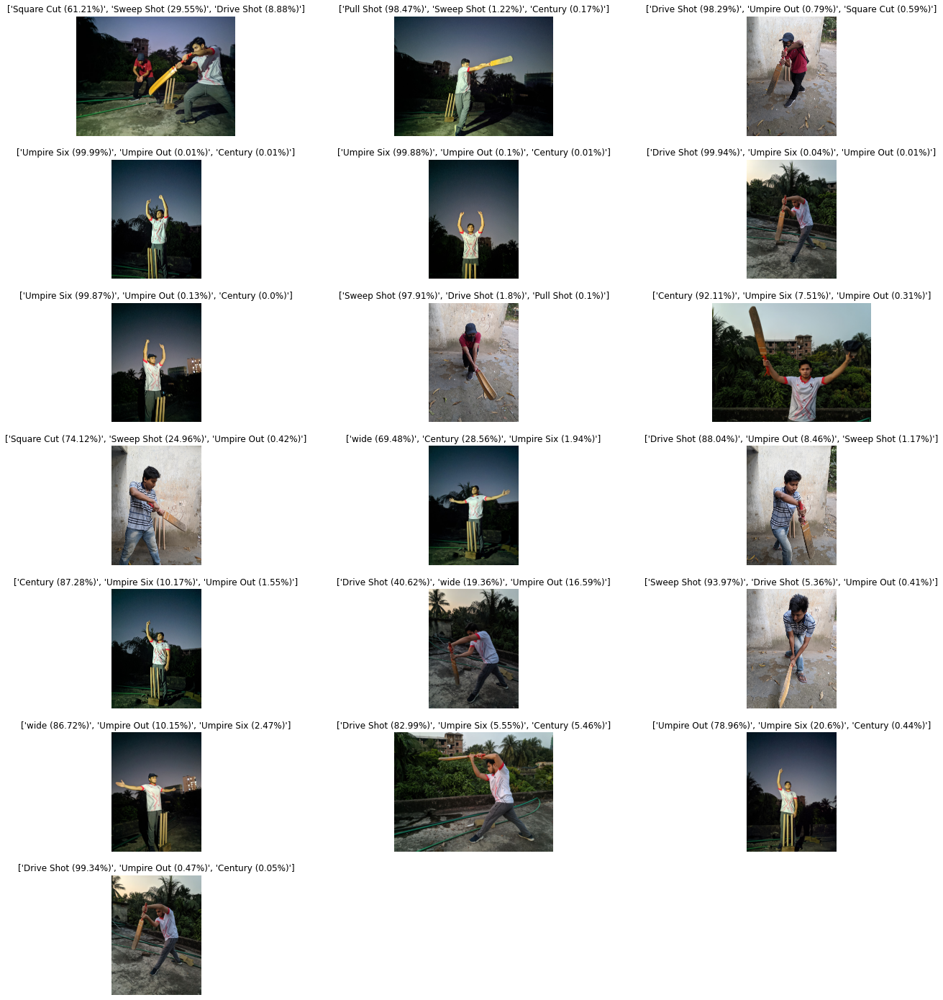

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import math 

plt.figure(figsize=[20,25])
plt.subplots_adjust(wspace = 0.9)
k=0

for i in data.test_ds.items:
  img = open_image(i)

  # Get best first prediction
  pred_1_class, indice, preds = learn.predict(img)

  # Get all best predictions
  preds_sorted, idxs = preds.sort(descending=True)

  # Get best 3 predictions - classes
  pred_2_class = learn.data.classes[idxs[1]]
  pred_3_class = learn.data.classes[idxs[2]]
    
  # Get best 3 predictions - probabilities
  pred_1_prob = np.round(100*preds_sorted[0].item(),2)
  pred_2_prob = np.round(100*preds_sorted[1].item(),2)
  pred_3_prob = np.round(100*preds_sorted[2].item(),2)
  preds_best3 = [f'{pred_1_class} ({pred_1_prob}%)', f'{pred_2_class} ({pred_2_prob}%)', f'{pred_3_class} ({pred_3_prob}%)']

  axarr = plt.subplot(math.ceil(data.test_ds.items.shape[0]/3),3,k+1)
  k = k+1
  axarr.axis('off')
  img1 = Image.open(i)
  plt.title(preds_best3)
  imgplot = plt.imshow(img1)

  #img.show(title=preds_best3)
plt.show()

####resnet101

In [ ]:
defaults.device = torch.device('cuda')

In [ ]:
learn = load_learner(model_path, 'resNet101.pkl')

In [ ]:
y = data.valid_ds.y.items
preds,y_hat,losses = learn.get_preds(with_loss=True)

from sklearn.metrics import classification_report
y_hat = np.argmax(preds,axis=1)
print(classification_report(y, y_hat, target_names=data.valid_ds.y.classes))

              precision    recall  f1-score   support

     Century       0.97      0.97      0.97       199
  Drive Shot       0.93      0.91      0.92       127
   Pull Shot       0.87      0.81      0.84        74
  Square Cut       0.74      0.83      0.78        52
  Sweep Shot       0.88      0.90      0.89        63
  Umpire Out       0.92      0.81      0.86        27
  Umpire Six       0.89      0.88      0.88        48
         lbw       1.00      1.00      1.00        27
        wide       0.96      1.00      0.98        22

    accuracy                           0.91       639
   macro avg       0.91      0.90      0.90       639
weighted avg       0.91      0.91      0.91       639



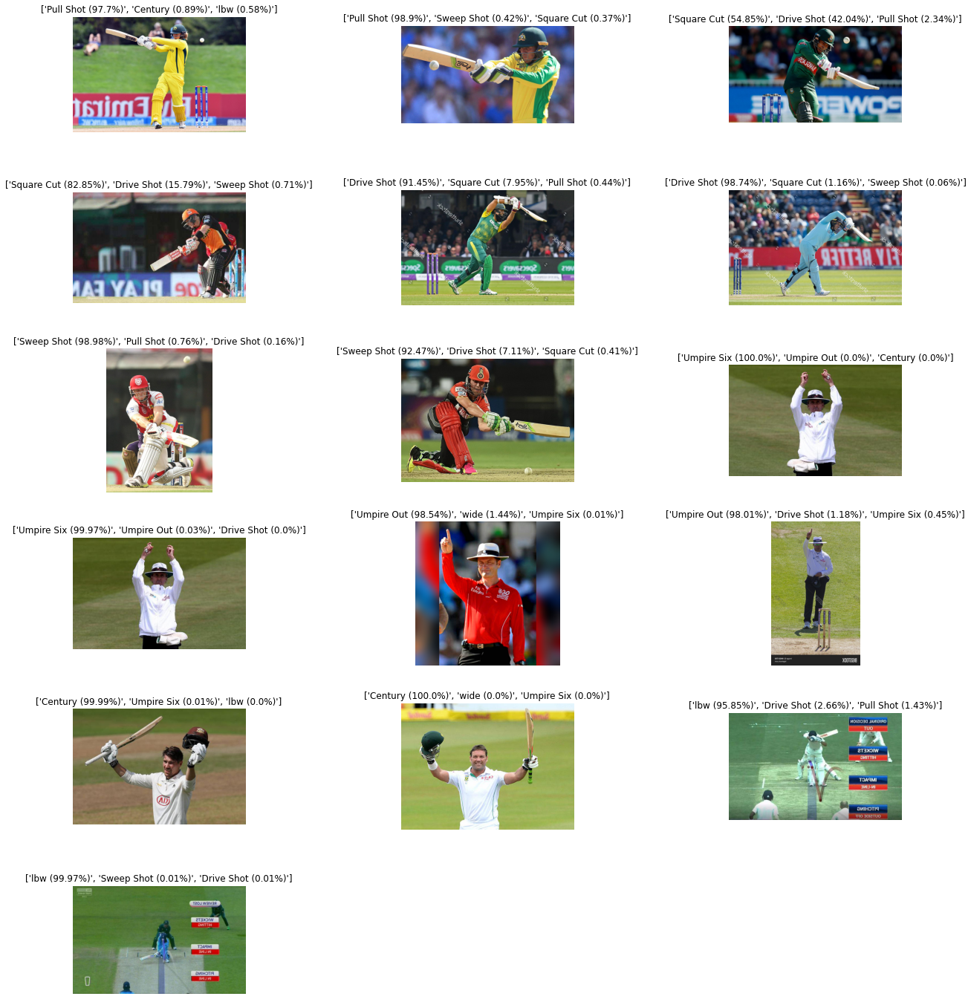

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import math 

plt.figure(figsize=[20,25])
plt.subplots_adjust(wspace = 0.9)
k=0

for i in data.test_ds.items:
  img = open_image(i)

  # Get best first prediction
  pred_1_class, indice, preds = learn.predict(img)

  # Get all best predictions
  preds_sorted, idxs = preds.sort(descending=True)

  # Get best 3 predictions - classes
  pred_2_class = learn.data.classes[idxs[1]]
  pred_3_class = learn.data.classes[idxs[2]]
    
  # Get best 3 predictions - probabilities
  pred_1_prob = np.round(100*preds_sorted[0].item(),2)
  pred_2_prob = np.round(100*preds_sorted[1].item(),2)
  pred_3_prob = np.round(100*preds_sorted[2].item(),2)
  preds_best3 = [f'{pred_1_class} ({pred_1_prob}%)', f'{pred_2_class} ({pred_2_prob}%)', f'{pred_3_class} ({pred_3_prob}%)']

  axarr = plt.subplot(math.ceil(data.test_ds.items.shape[0]/3),3,k+1)
  k = k+1
  axarr.axis('off')
  img1 = Image.open(i)
  plt.title(preds_best3)
  imgplot = plt.imshow(img1)

  #img.show(title=preds_best3)
plt.show()

####resnet34

In [ ]:
defaults.device = torch.device('cuda')

In [ ]:
learn = load_learner(model_path, 'resNet34.pkl')

In [ ]:
y = data.valid_ds.y.items
preds,y_hat,losses = learn.get_preds(with_loss=True)

from sklearn.metrics import classification_report
y_hat = np.argmax(preds,axis=1)
print(classification_report(y, y_hat, target_names=data.valid_ds.y.classes))

              precision    recall  f1-score   support

     Century       0.98      0.99      0.99       199
  Drive Shot       0.98      0.98      0.98       127
   Pull Shot       0.97      0.99      0.98        74
  Square Cut       0.98      0.94      0.96        52
  Sweep Shot       0.95      0.98      0.97        63
  Umpire Out       0.96      0.85      0.90        27
  Umpire Six       0.91      0.88      0.89        48
         lbw       1.00      1.00      1.00        27
        wide       0.88      1.00      0.94        22

    accuracy                           0.97       639
   macro avg       0.96      0.96      0.96       639
weighted avg       0.97      0.97      0.97       639



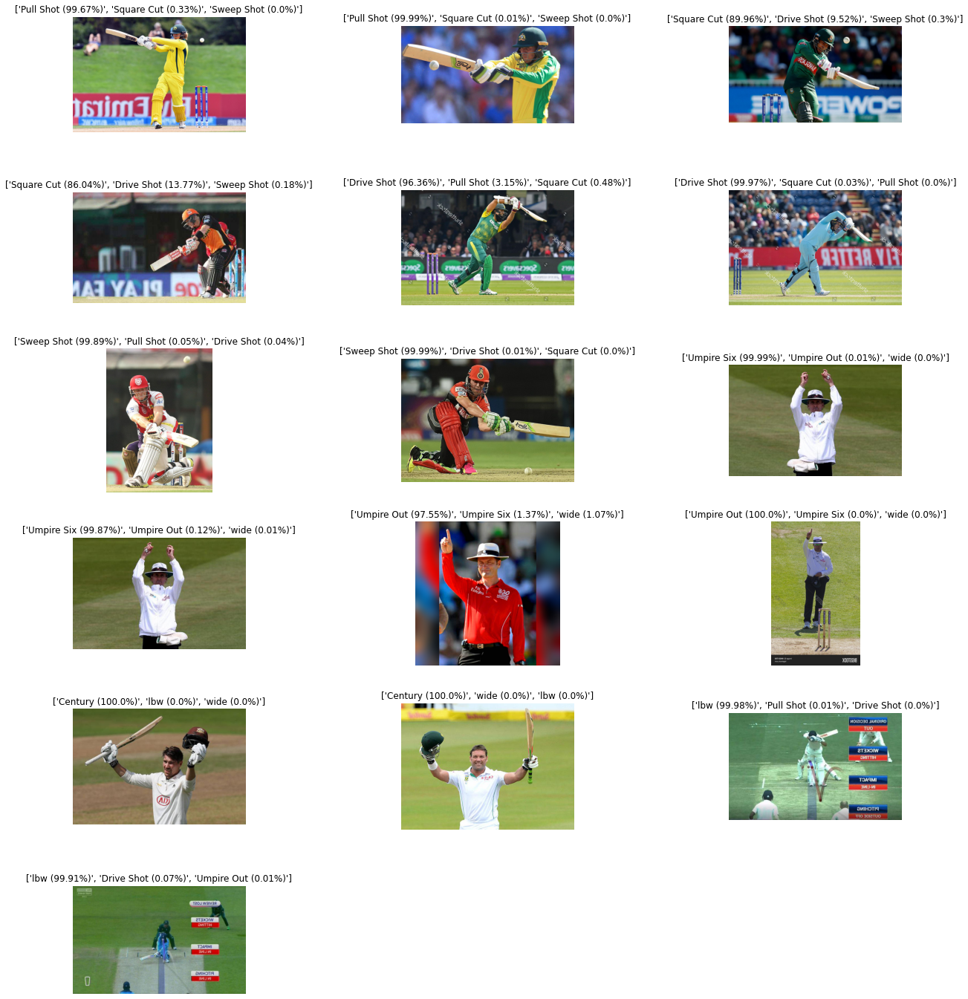

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import math 

plt.figure(figsize=[20,25])
plt.subplots_adjust(wspace = 0.9)
k=0

for i in data.test_ds.items:
  img = open_image(i)

  # Get best first prediction
  pred_1_class, indice, preds = learn.predict(img)

  # Get all best predictions
  preds_sorted, idxs = preds.sort(descending=True)

  # Get best 3 predictions - classes
  pred_2_class = learn.data.classes[idxs[1]]
  pred_3_class = learn.data.classes[idxs[2]]
    
  # Get best 3 predictions - probabilities
  pred_1_prob = np.round(100*preds_sorted[0].item(),2)
  pred_2_prob = np.round(100*preds_sorted[1].item(),2)
  pred_3_prob = np.round(100*preds_sorted[2].item(),2)
  preds_best3 = [f'{pred_1_class} ({pred_1_prob}%)', f'{pred_2_class} ({pred_2_prob}%)', f'{pred_3_class} ({pred_3_prob}%)']

  axarr = plt.subplot(math.ceil(data.test_ds.items.shape[0]/3),3,k+1)
  k = k+1
  axarr.axis('off')
  img1 = Image.open(i)
  plt.title(preds_best3)
  imgplot = plt.imshow(img1)

  #img.show(title=preds_best3)
plt.show()

####vgg

In [ ]:
defaults.device = torch.device('cuda')

In [ ]:
learn = load_learner(model_path, 'vgg16_bn.pkl')

In [ ]:
y = data.valid_ds.y.items
preds,y_hat,losses = learn.get_preds(with_loss=True)

from sklearn.metrics import classification_report
y_hat = np.argmax(preds,axis=1)
print(classification_report(y, y_hat, target_names=data.valid_ds.y.classes))

              precision    recall  f1-score   support

     Century       1.00      0.99      0.99       199
  Drive Shot       0.97      0.98      0.98       127
   Pull Shot       0.97      0.95      0.96        74
  Square Cut       0.92      0.92      0.92        52
  Sweep Shot       0.95      0.97      0.96        63
  Umpire Out       0.88      0.78      0.82        27
  Umpire Six       0.88      0.90      0.89        48
         lbw       0.96      1.00      0.98        27
        wide       0.92      1.00      0.96        22

    accuracy                           0.96       639
   macro avg       0.94      0.94      0.94       639
weighted avg       0.96      0.96      0.96       639



In [ ]:
print(preds)
print(y_hat.shape)

tensor([[3.0285e-08, 9.9973e-01, 5.9649e-07,  ..., 2.5423e-06, 5.7806e-05,
         2.7957e-07],
        [9.9998e-01, 1.4175e-07, 4.6703e-08,  ..., 8.5282e-06, 1.1589e-06,
         2.5022e-07],
        [1.0000e+00, 8.1192e-11, 1.7105e-09,  ..., 4.7332e-08, 1.6990e-08,
         1.2305e-07],
        ...,
        [1.0000e+00, 7.8871e-09, 1.0633e-09,  ..., 6.4047e-08, 6.2626e-09,
         4.5591e-09],
        [4.8188e-09, 9.9933e-01, 3.5613e-07,  ..., 2.2090e-06, 7.4824e-07,
         4.8180e-06],
        [2.8418e-08, 9.9989e-01, 2.7975e-07,  ..., 5.8305e-06, 2.5627e-07,
         2.6598e-07]])
torch.Size([639])


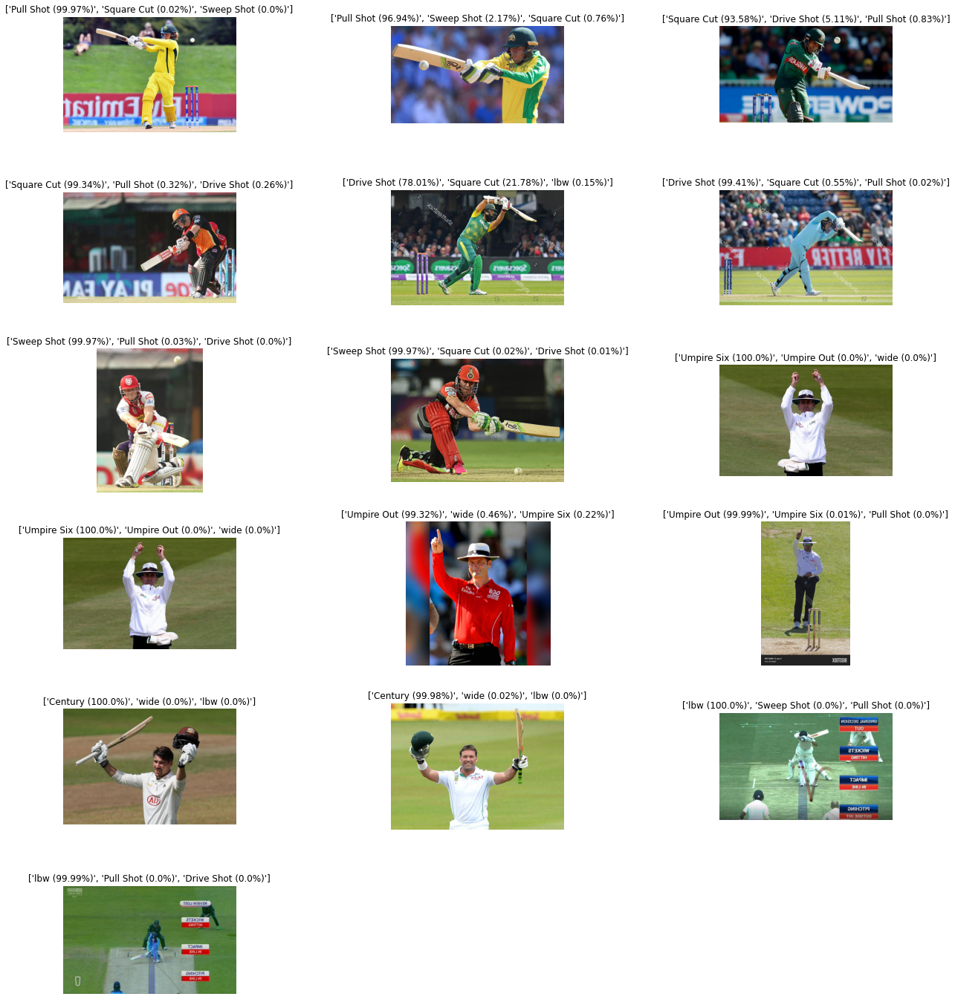

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import math 

plt.figure(figsize=[20,25])
plt.subplots_adjust(wspace = 0.9)
k=0

for i in data.test_ds.items:
  img = open_image(i)

  # Get best first prediction
  pred_1_class, indice, preds = learn.predict(img)

  # Get all best predictions
  preds_sorted, idxs = preds.sort(descending=True)

  # Get best 3 predictions - classes
  pred_2_class = learn.data.classes[idxs[1]]
  pred_3_class = learn.data.classes[idxs[2]]
    
  # Get best 3 predictions - probabilities
  pred_1_prob = np.round(100*preds_sorted[0].item(),2)
  pred_2_prob = np.round(100*preds_sorted[1].item(),2)
  pred_3_prob = np.round(100*preds_sorted[2].item(),2)
  preds_best3 = [f'{pred_1_class} ({pred_1_prob}%)', f'{pred_2_class} ({pred_2_prob}%)', f'{pred_3_class} ({pred_3_prob}%)']

  axarr = plt.subplot(math.ceil(data.test_ds.items.shape[0]/3),3,k+1)
  k = k+1
  axarr.axis('off')
  img1 = Image.open(i)
  plt.title(preds_best3)
  imgplot = plt.imshow(img1)

  #img.show(title=preds_best3)
plt.show()

####alexnet

In [ ]:
defaults.device = torch.device('cuda')

In [ ]:
learn = load_learner(model_path, 'resNet50.pkl')

In [ ]:
y = data.valid_ds.y.items
preds,y_hat,losses = learn.get_preds(with_loss=True)

from sklearn.metrics import classification_report
y_hat = np.argmax(preds,axis=1)
print(classification_report(y, y_hat, target_names=data.valid_ds.y.classes))

              precision    recall  f1-score   support

     Century       0.91      0.91      0.91       199
  Drive Shot       0.79      0.86      0.82       127
   Pull Shot       0.75      0.68      0.71        74
  Square Cut       0.60      0.63      0.62        52
  Sweep Shot       0.81      0.76      0.79        63
  Umpire Out       0.86      0.70      0.78        27
  Umpire Six       0.75      0.81      0.78        48
         lbw       0.93      0.96      0.95        27
        wide       0.89      0.77      0.83        22

    accuracy                           0.82       639
   macro avg       0.81      0.79      0.80       639
weighted avg       0.82      0.82      0.82       639



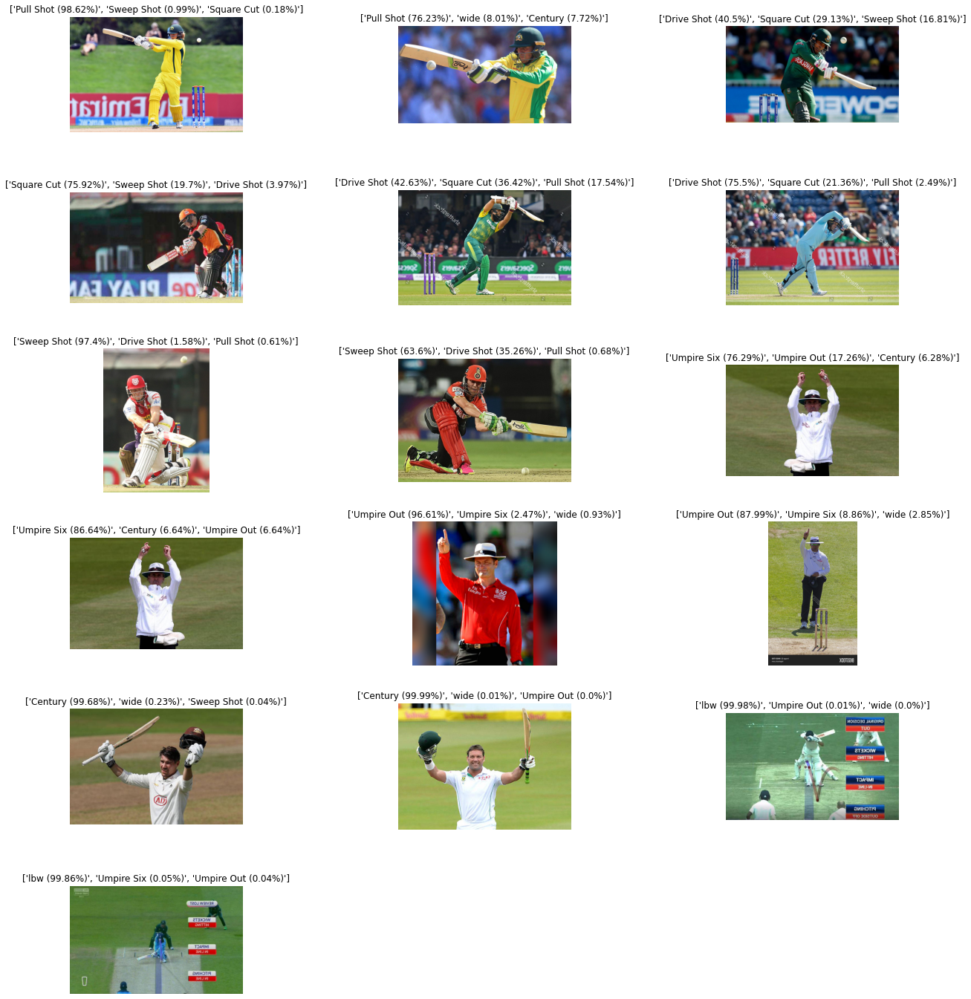

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import math 

plt.figure(figsize=[20,25])
plt.subplots_adjust(wspace = 0.9)
k=0

for i in data.test_ds.items:
  img = open_image(i)

  # Get best first prediction
  pred_1_class, indice, preds = learn.predict(img)

  # Get all best predictions
  preds_sorted, idxs = preds.sort(descending=True)

  # Get best 3 predictions - classes
  pred_2_class = learn.data.classes[idxs[1]]
  pred_3_class = learn.data.classes[idxs[2]]
    
  # Get best 3 predictions - probabilities
  pred_1_prob = np.round(100*preds_sorted[0].item(),2)
  pred_2_prob = np.round(100*preds_sorted[1].item(),2)
  pred_3_prob = np.round(100*preds_sorted[2].item(),2)
  preds_best3 = [f'{pred_1_class} ({pred_1_prob}%)', f'{pred_2_class} ({pred_2_prob}%)', f'{pred_3_class} ({pred_3_prob}%)']

  axarr = plt.subplot(math.ceil(data.test_ds.items.shape[0]/3),3,k+1)
  k = k+1
  axarr.axis('off')
  img1 = Image.open(i)
  plt.title(preds_best3)
  imgplot = plt.imshow(img1)

  #img.show(title=preds_best3)
plt.show()

##Video

In [ ]:
t = torch.tensor(np.ascontiguousarray(np.flip(frame, 2)).transpose(2,0,1)).float()/255
img = Image(t) # fastai.vision.Image, not PIL.Image
p = learn.predict(img)

##HEATMAP

In [ ]:
x,y = data.valid_ds[400]

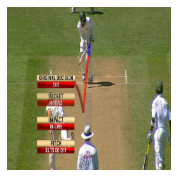

In [ ]:
x.show()

In [ ]:
learn.predict(x)

(Category tensor(7),
 tensor(7),
 tensor([3.7522e-04, 1.9260e-06, 1.5866e-05, 8.2963e-06, 2.0177e-08, 1.7431e-04,
         3.9828e-07, 9.9941e-01, 1.2789e-05]))

In [ ]:
m = learn.model.eval()

In [ ]:
xb,_ = data.one_item(x)
xb_im = Image(data.denorm(xb)[0])
xb = xb.cuda()

In [ ]:
from fastai.callbacks.hooks import *

In [ ]:
def hooked_backward(cat=y):
    with hook_output(m[0]) as hook_a: 
        with hook_output(m[0], grad=True) as hook_g:
            preds = m(xb)
            preds[0,int(cat)].backward()
    return hook_a,hook_g

In [ ]:
hook_a,hook_g = hooked_backward()

In [ ]:
acts  = hook_a.stored[0].cpu()
acts.shape

torch.Size([2048, 7, 7])

In [ ]:
avg_acts = acts.mean(0)
avg_acts.shape

torch.Size([7, 7])

In [ ]:
def show_heatmap(hm):
    _,ax = plt.subplots()
    xb_im.show(ax)
    ax.imshow(hm, alpha=0.6, extent=(0,224,224,0),
              interpolation='bilinear', cmap='magma');

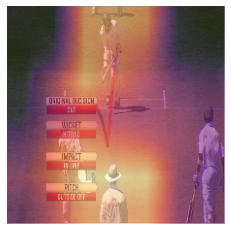

In [ ]:
show_heatmap(avg_acts)